# Step 0: Environment and Tool Sanity Check

Before starting with data loading or model implementation, it is essential to check if:
- GPU (CUDA) is available and recognized properly.
- Weights & Biases (wandb) is correctly installed and configured.

Next two code cells will run a small sanity check:
1. Print CUDA and GPU details.
2. Initialize wandb project.
3. Log a few dummy metrics to verify correct setup.

Make sure you have:
- Installed wandb (`pip install wandb`)
- Logged into wandb in your terminal using `wandb login`


In [3]:
# Import necessary packages
import torch
import wandb

# Check CUDA availability
print("CUDA Available:", torch.cuda.is_available())
print("GPU Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU found")
print("CUDA Version:", torch.version.cuda)
print("cuDNN Version:", torch.backends.cudnn.version())


CUDA Available: True
GPU Name: NVIDIA GeForce RTX 4060 Laptop GPU
CUDA Version: 12.1
cuDNN Version: 90100


## Initialize WandB Project

In this assignment, Weights & Biases (wandb) will be used for:
- Logging experiments
- Tracking training/validation metrics
- Visualizing results

The current project name is set as:
`vit-object-detection`

This is the project URL:
[WandB Project](https://wandb.ai/turkanispak-middle-east-technical-university/vit-object-detection)


In [5]:
# Initialize wandb run
wandb.init(project="vit-object-detection", entity="turkanispak-middle-east-technical-university")

# Log dummy config and metrics
wandb.config = {
    "learning_rate": 0.001,
    "epochs": 5
}

# Dummy logging
for i in range(5):
    wandb.log({"epoch": i, "dummy_loss": 5 / (i+1)})


wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: turkanispak (turkanispak-middle-east-technical-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [20]:
!pip install -U -q datasets transformers[torch] timm wandb torchmetrics matplotlib albumentations
# Tested with datasets==2.21.0, transformers==4.44.2 timm==1.0.9, wandb==0.17.9 torchmetrics==1.4.1

## Step 1: Dataset Exploration and Understanding

Before diving into model training, it's crucial to understand the AU-AIR dataset's structure and challenges. This dataset contains drone-captured aerial images with annotations in a custom JSON format.

### Why is this important?
Object detection datasets like AU-AIR often have:
- Class imbalance
- Very small or very large objects
- Images with very few or very many annotations
- Varying image resolutions

Without understanding these, models can overfit or fail dramatically.

### Overview
Each entry in the annotations file contains:
- The image filename and its dimensions,
- Platform and timestamp metadata,
- One or more bounding boxes in the form:
  ```json
  {"top": 163, "left": 1098, "height": 185, "width": 420, "class": 1}
  ```
  where `"class"` refers to an index in the `categories` list (e.g., `"Car"`, `"Human"`).

We perform exploratory data analysis (EDA) on:
- **Object category distribution** (e.g., how many cars, humans, etc.),
- **Bounding boxes per image**,
- **Object size distributions** (area of boxes),
- **Image size scatter plot**,
- Exported statistics as CSV.

> Note: All EDA outputs are saved to the `eda/` directory for further inspection.


### What does `eda.py` do?

This script analyzes the dataset in 6 main sections, saving all outputs in the `eda/` folder for inspection later.

| Section | Purpose | Output |
|---------|---------|--------|
|Dataset Basic Info| General summary of dataset | Console log |
|Category Distribution| Object frequency per class | Barplot PNG + CSV |
|Bounding Boxes per Image| How many objects per image | Histogram PNG |
|Bounding Box Size Distribution| How big the objects are | Histogram + Scatter PNG |
|Annotated Sample Images| Visual inspection with drawn boxes | 5 Random + Extreme cases PNG |
|Console Logging| Track every important finding | `eda/eda.log` |

Where extreme cases can be defined as
1. Extreme case 1: Image with most bboxes
2. Extreme case 2: Image with smallest bbox
3. Extreme case 3: Image with largest bbox

In [19]:
# Run the EDA script
!python eda.py

Analyzing annotations...
Total images: 32823
Total bounding boxes: 132031
Number of categories: 8
Categories: ['Human', 'Car', 'Truck', 'Van', 'Motorbike', 'Bicycle', 'Bus', 'Trailer']
Saved category distribution.
Saved bbox per image plot.
Saved bbox area & scatter plots.
Saving annotated sample images...
Saved 8 sample images in eda/samples/
EDA completed successfully.


### EDA Outputs

Below are the generated plots from our EDA:

#### Object Category Distribution


Displaying: bbox_area_distribution.png


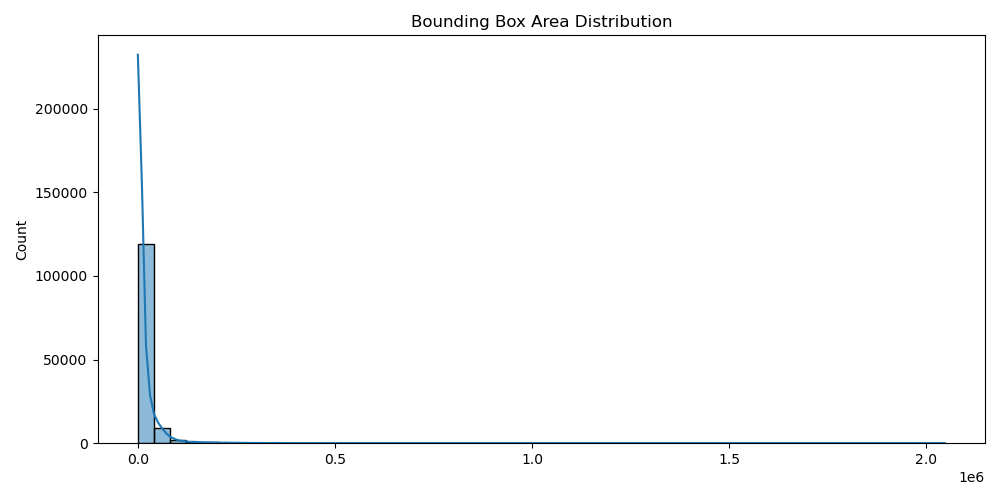

Displaying: bbox_per_image.png


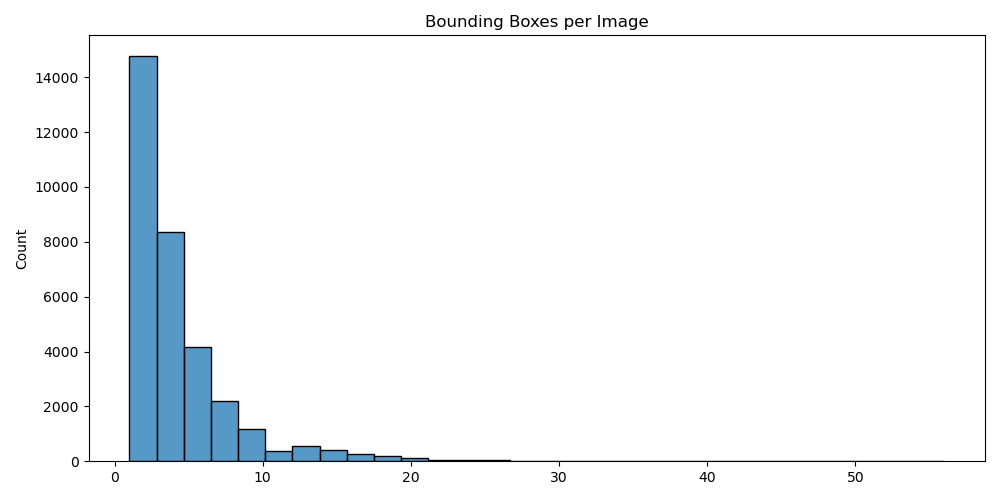

Displaying: bbox_width_height_scatter.png


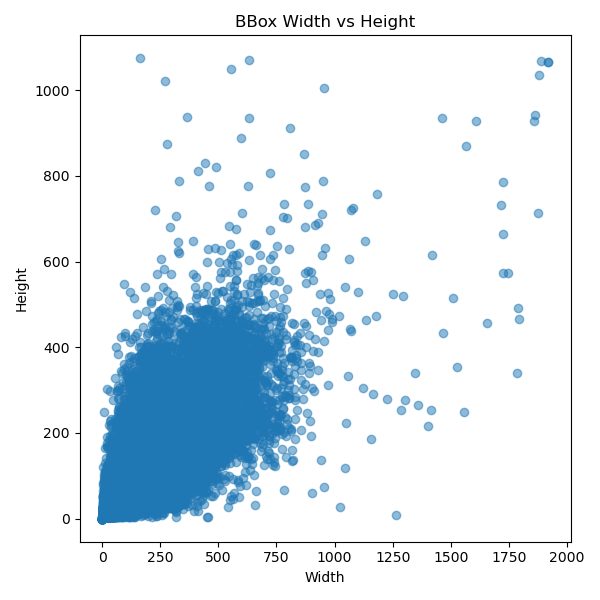

Displaying: category_distribution.png


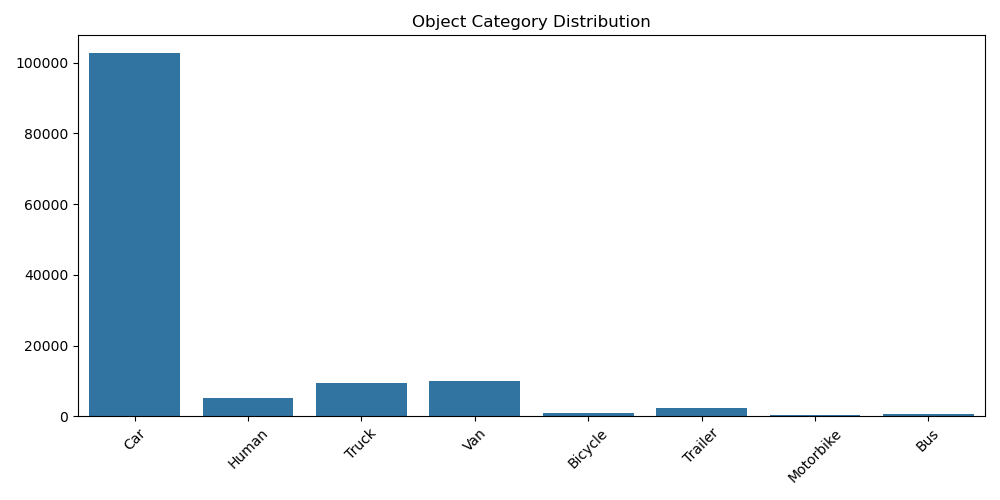

In [21]:
# Step 2 - Display All EDA Plots
from IPython.display import Image as IPImage, display
import os

eda_folder = 'eda'

for file in os.listdir(eda_folder):
    if file.endswith('.png'):
        print(f"Displaying: {file}")
        display(IPImage(filename=os.path.join(eda_folder, file)))


=== Random Sample 1 ===


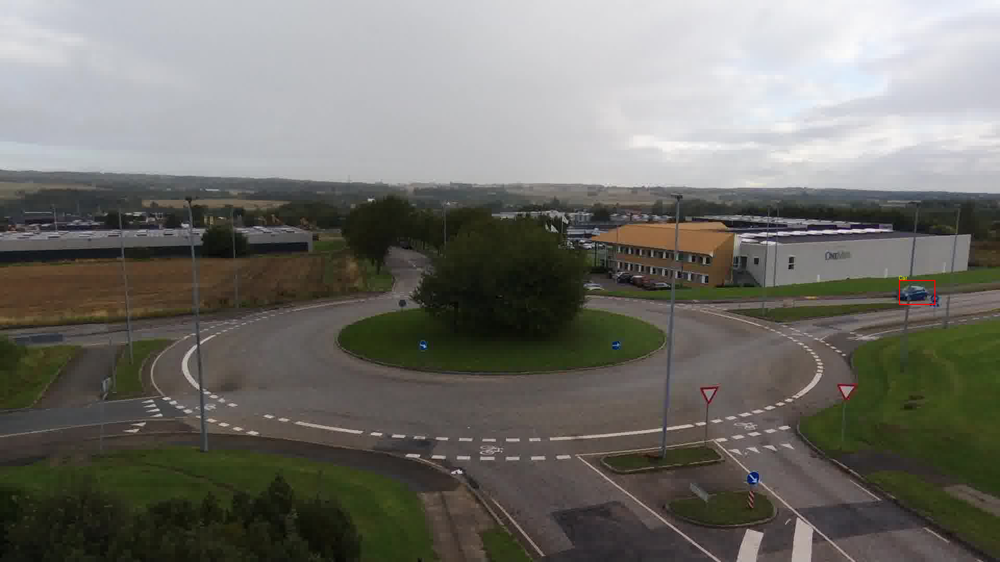

=== Random Sample 2 ===


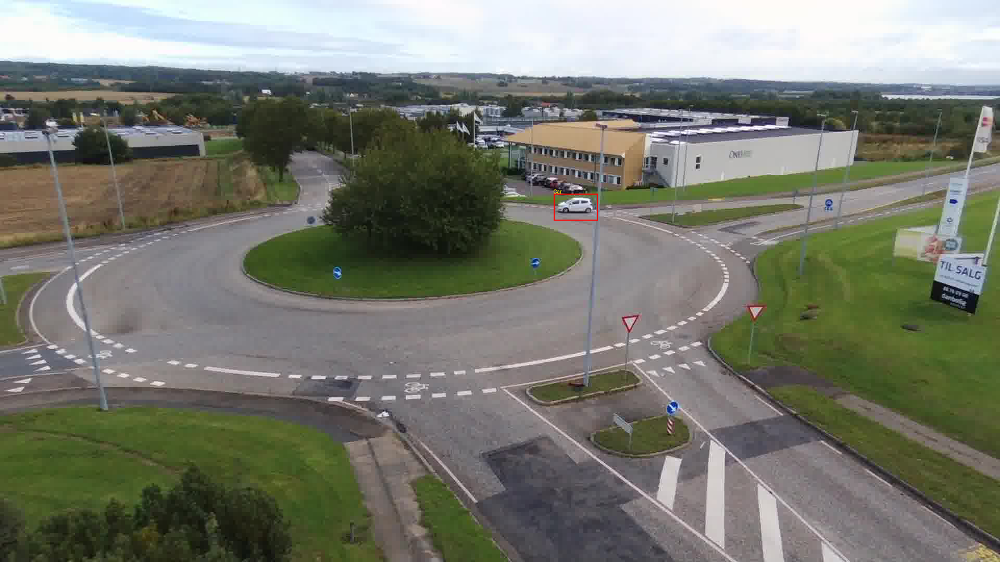

=== Random Sample 3 ===


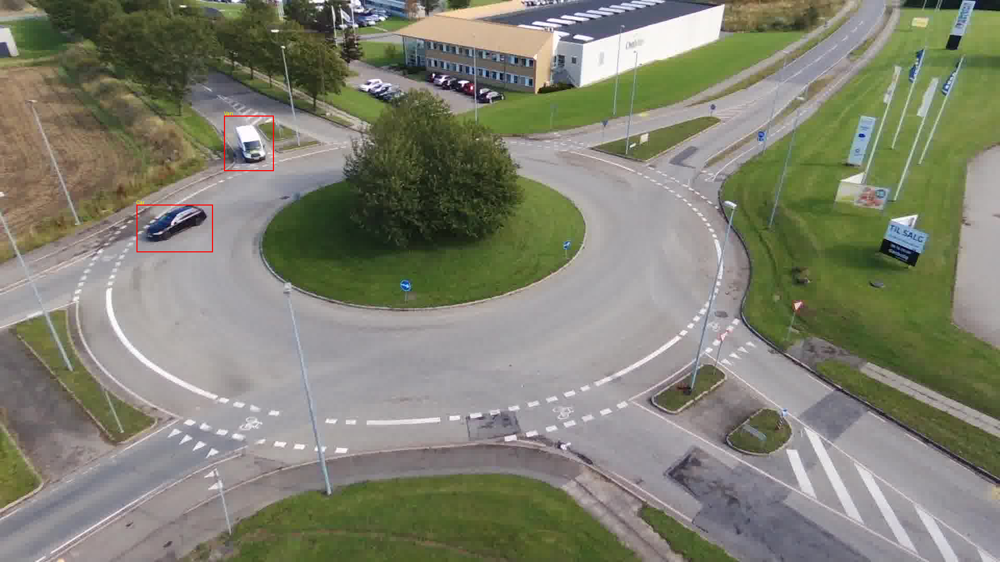

=== Random Sample 4 ===


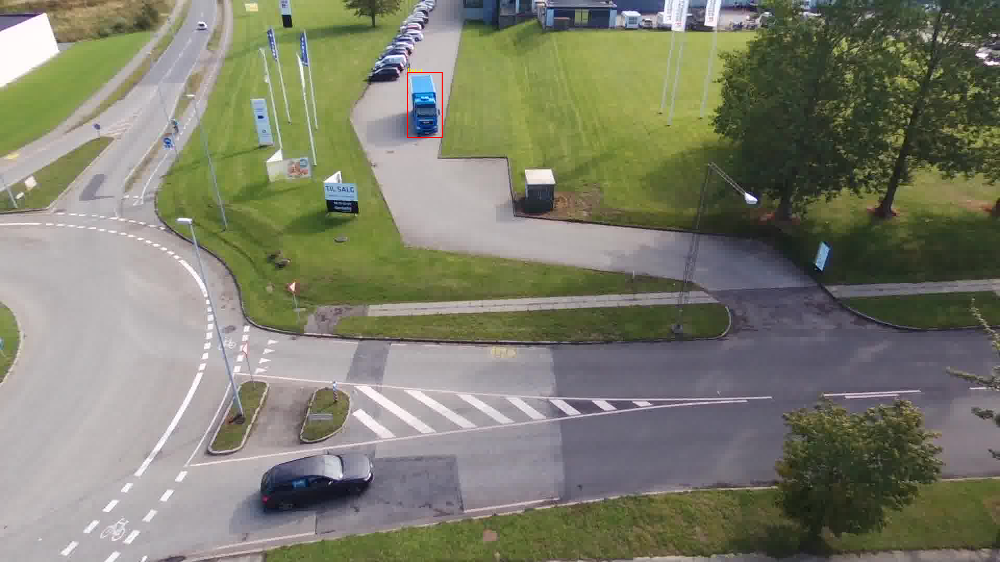

=== Random Sample 5 ===


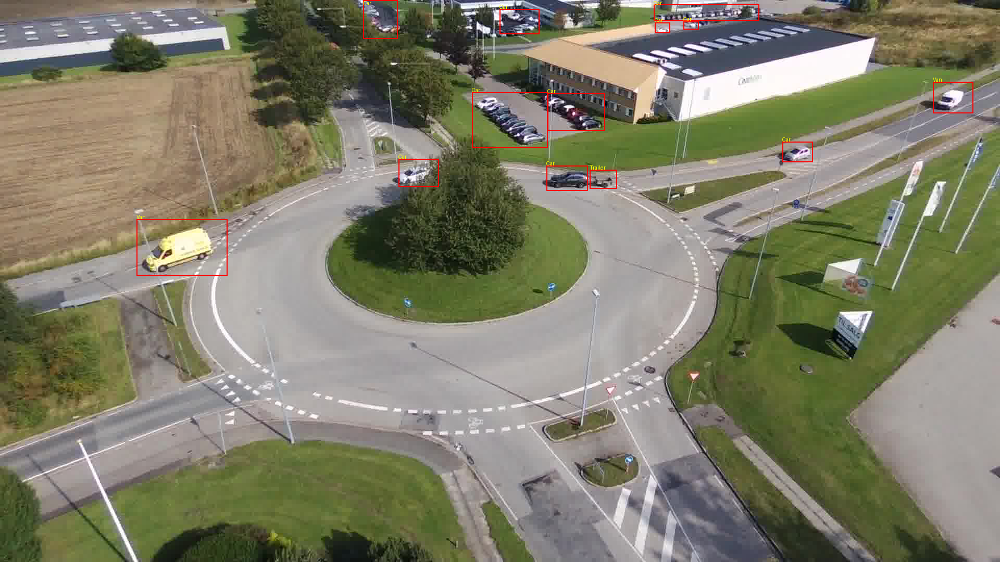

=== Extreme Case 1 - Most Bounding Boxes ===


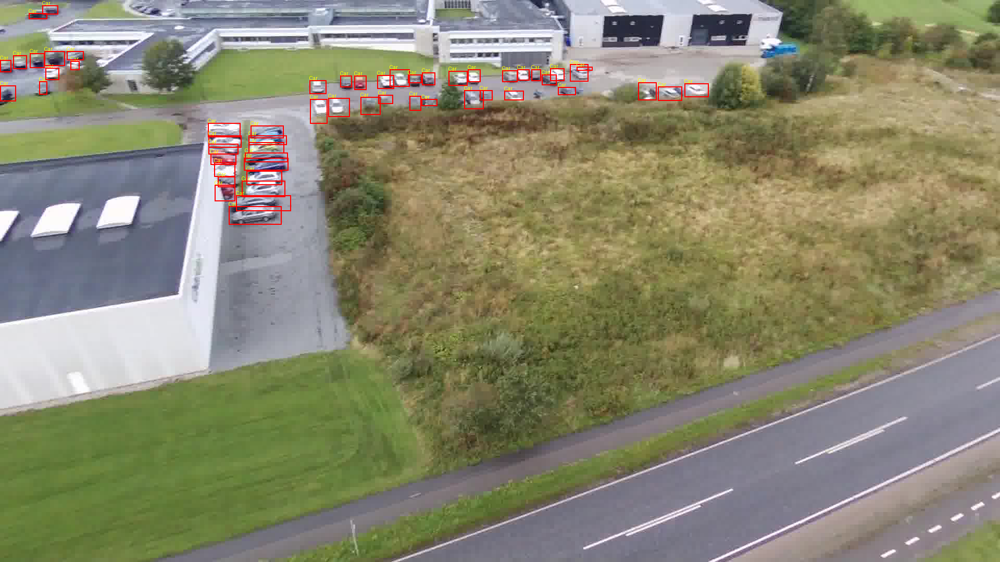

=== Extreme Case 2 - Smallest Bounding Box ===


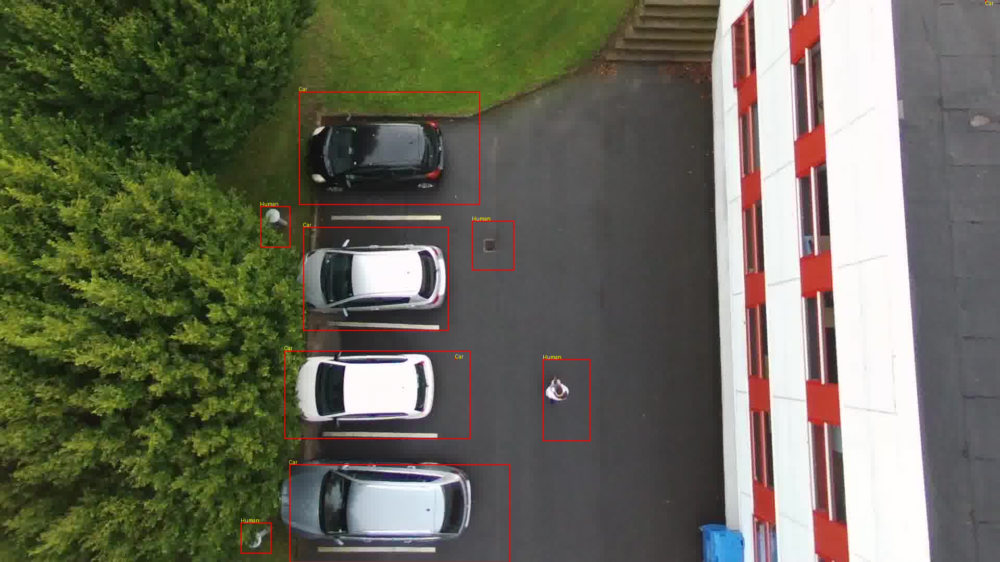

=== Extreme Case 3 - Largest Bounding Box ===


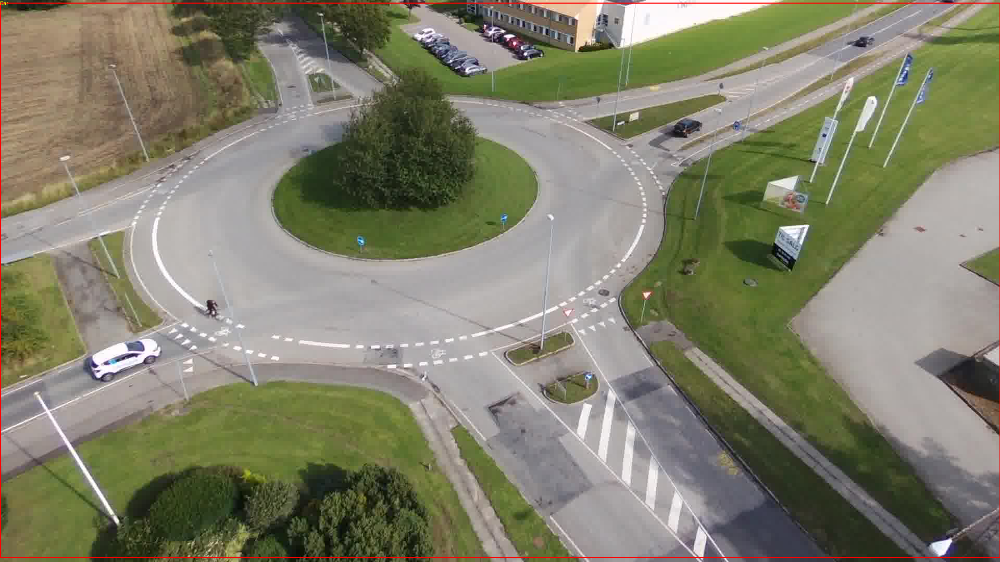

In [29]:
from IPython.display import display, Image as IPImage
import os

# Paths to your saved samples
sample_paths = [
    ('Random Sample 1', 'eda/samples/sample_1.png'),
    ('Random Sample 2', 'eda/samples/sample_2.png'),
    ('Random Sample 3', 'eda/samples/sample_3.png'),
    ('Random Sample 4', 'eda/samples/sample_4.png'),
    ('Random Sample 5', 'eda/samples/sample_5.png'),
    ('Extreme Case 1 - Most Bounding Boxes', 'eda/samples/sample_6.png'),
    ('Extreme Case 2 - Smallest Bounding Box', 'eda/samples/sample_7.png'),
    ('Extreme Case 3 - Largest Bounding Box', 'eda/samples/sample_8.png'),
]

# Display with titles
for title, path in sample_paths:
    print(f'=== {title} ===')
    display(IPImage(filename=path))


### Console Output Log

Let's review the console outputs captured during the EDA process.


In [23]:
# Display the EDA log
with open('eda/eda.log', 'r') as log_file:
    print(log_file.read())


Analyzing annotations...
Total images: 32823
Total bounding boxes: 132031
Number of categories: 8
Categories: ['Human', 'Car', 'Truck', 'Van', 'Motorbike', 'Bicycle', 'Bus', 'Trailer']
Saved category distribution.
Saved bbox per image plot.
Saved bbox area & scatter plots.
Saving annotated sample images...
Saved 8 sample images in eda/samples/
EDA completed successfully.



Looking at the smallest and largest bouding boxes raises an important question that needs to be explored further:
Are these large boxes just the entire image? Maybe annotation mistakes?
Are the tiny ones even visible or meaningful?
So let's continue with inspection of 5 tails from each end

=== Smallest Bounding Boxes ===
smallest 1: Area = 0, Class = Car


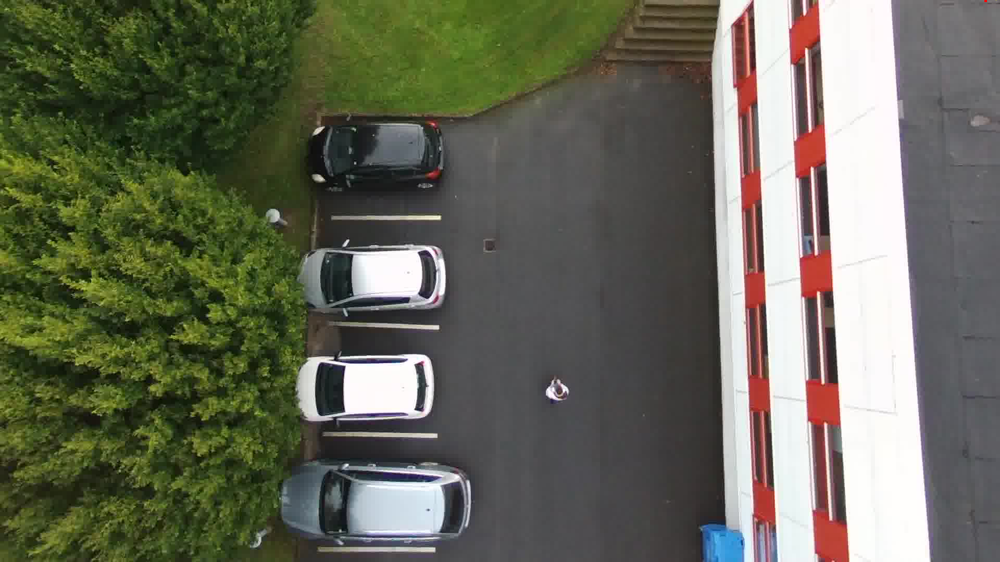

smallest 2: Area = 0, Class = Car


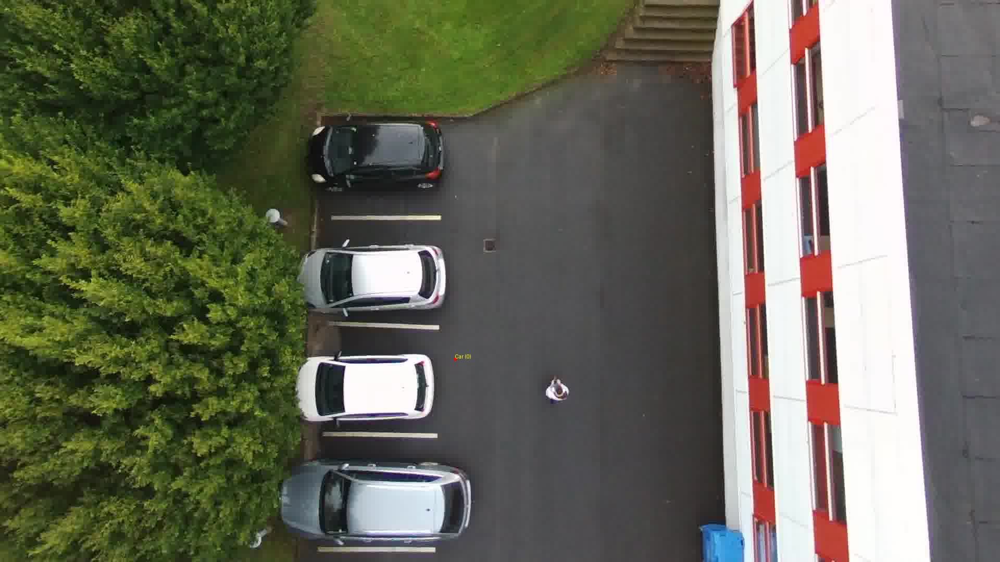

smallest 3: Area = 0, Class = Human


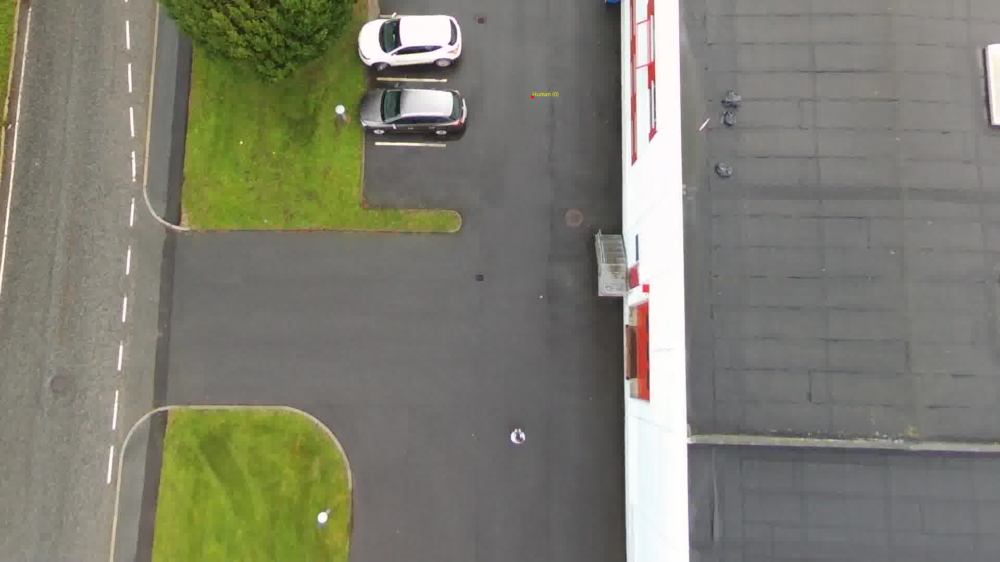

smallest 4: Area = 0, Class = Car


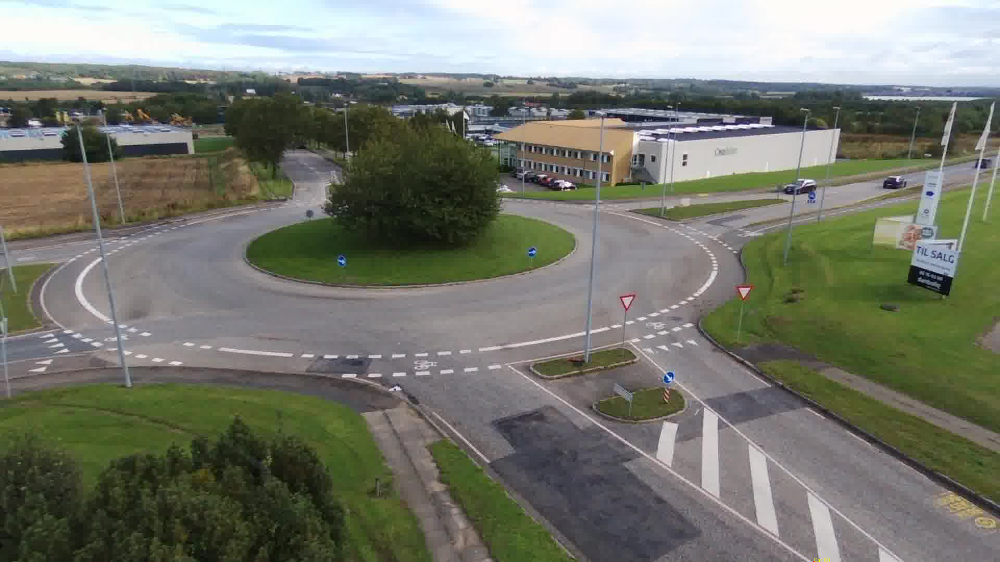

smallest 5: Area = 0, Class = Car


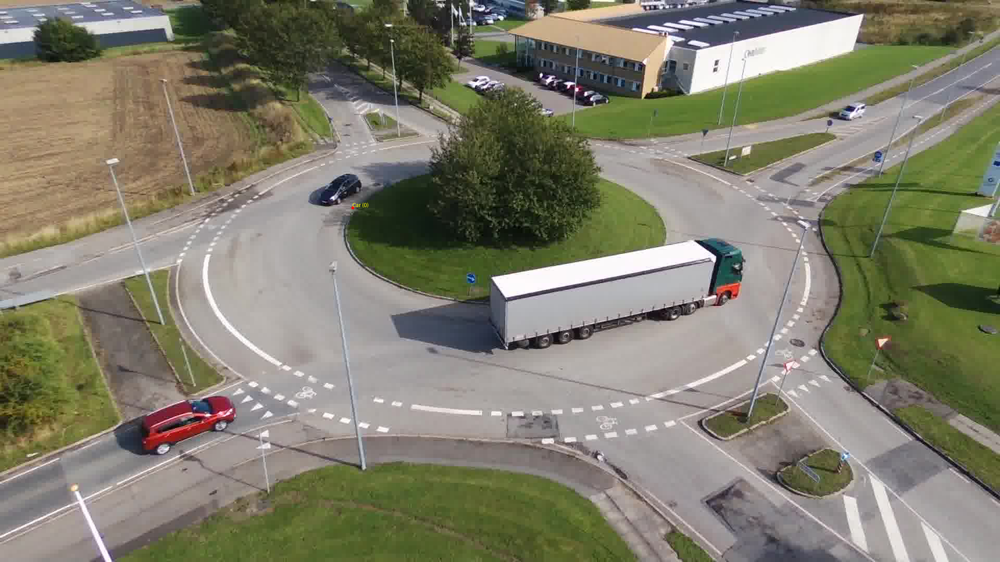

=== Largest Bounding Boxes ===
largest 1: Area = 1754024, Class = Car


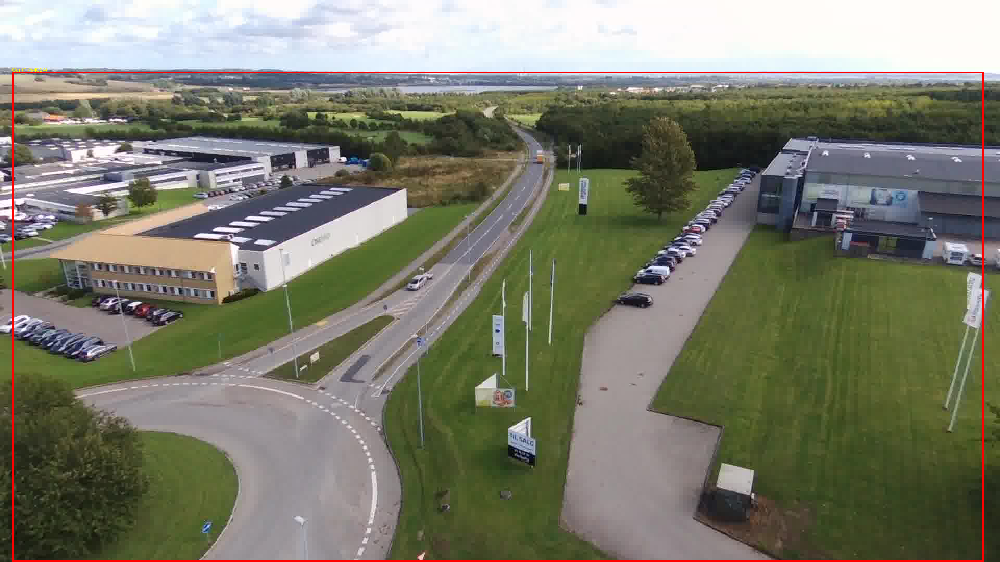

largest 2: Area = 1945608, Class = Car


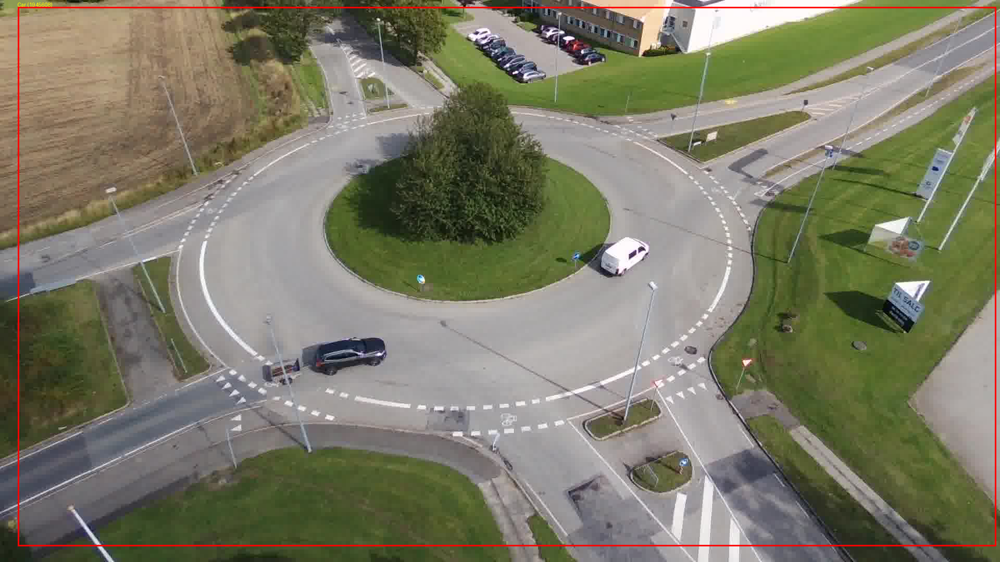

largest 3: Area = 2012362, Class = Car


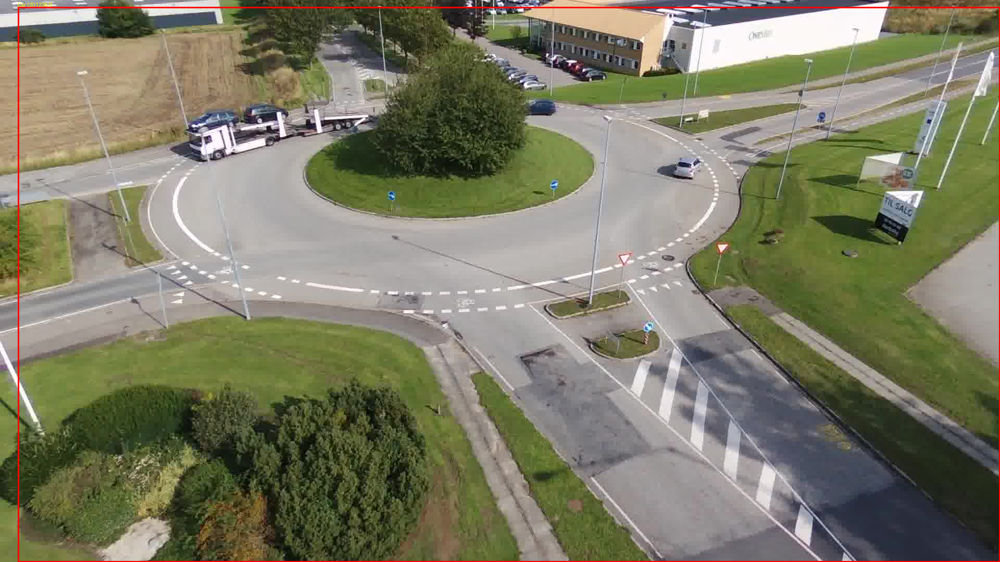

largest 4: Area = 2046720, Class = Car


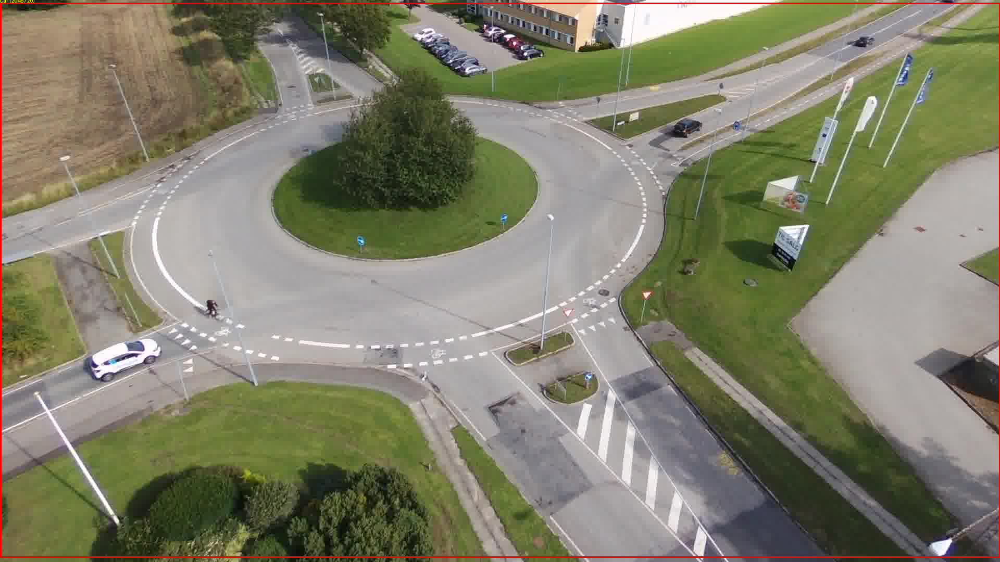

largest 5: Area = 2046720, Class = Car


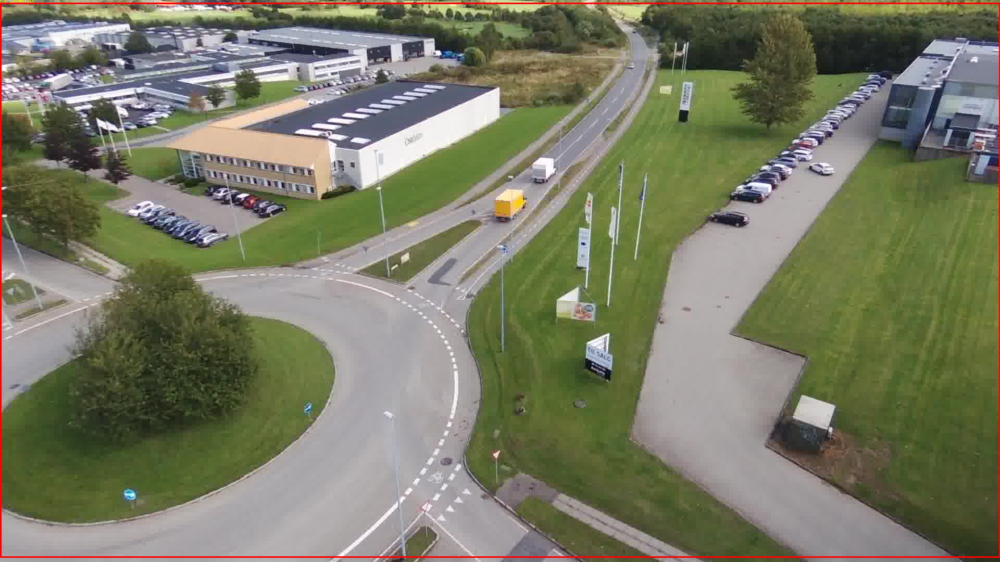

In [33]:
from PIL import Image, ImageDraw
import os
import matplotlib.pyplot as plt

# Load data again
with open('auair2019/annotations.json', 'r') as f:
    data = json.load(f)

category_id_to_name = {idx: name for idx, name in enumerate(data['categories'])}
annotations = data['annotations']

# Flatten all bboxes with image names
bbox_info = []
for ann in annotations:
    for box in ann['bbox']:
        area = box['width'] * box['height']
        bbox_info.append({
            'image_name': ann['image_name'],
            'left': box['left'],
            'top': box['top'],
            'width': box['width'],
            'height': box['height'],
            'area': area,
            'class': box['class']
        })

# Sort by area
sorted_bboxes = sorted(bbox_info, key=lambda x: x['area'])

# Smallest 5
smallest = sorted_bboxes[:5]
# Largest 5
largest = sorted_bboxes[-5:]

def draw_and_show(bboxes, title_prefix):
    for idx, box in enumerate(bboxes):
        path = os.path.join('auair2019', 'images', box['image_name'])
        img = Image.open(path).convert('RGB')
        draw = ImageDraw.Draw(img)

        # Draw box
        left, top = box['left'], box['top']
        right, bottom = left + box['width'], top + box['height']
        category_name = category_id_to_name[box['class']]
        draw.rectangle([left, top, right, bottom], outline='red', width=3)
        draw.text((left, top - 10), f"{category_name} ({box['area']:.0f})", fill='yellow')

        # Save and show
        save_path = f'eda/samples/{title_prefix}_{idx+1}.png'
        img.save(save_path)
        print(f"{title_prefix} {idx+1}: Area = {box['area']}, Class = {category_name}")
        display(IPImage(filename=save_path))

# Display smallest
print("=== Smallest Bounding Boxes ===")
draw_and_show(smallest, "smallest")

# Display largest
print("=== Largest Bounding Boxes ===")
draw_and_show(largest, "largest")


It seems some samples are really problematic, it is important to address these during data cleaning and preparation.

## Dataset Cleaning & Preparation (Model-Agnostic)

This stage is responsible for all dataset-wide EDA, cleaning, and balancing, and should be reusable regardless of the model architecture.

### Script: `dataset_prep.py`

### Responsibilities:
- Load raw annotations and images
- Clean bad annotations (bbox area, aspect ratio, etc.)
- Handle class imbalance (downsampling, upsampling, filtering images)
- Split dataset (train/val/test) deterministically
- Save:
  - Cleaned annotation JSONs
  - Optional: ready-to-use .csv with per-image bboxes
  - Class distribution plots
- Call your existing `eda.py` to compare raw vs cleaned

> Outputs from this script are used by all downstream model training scripts.

---

### Cleaning Parameters Used:
| Parameter | Purpose | Value |
|-----------|----------|-------|
|`--min_area_q`| Remove smallest 0.1% bboxes | `0.001` |
|`--max_area_q`| Remove largest 0.1% bboxes  | `0.999` |
|`--min_ar`| Aspect ratio lower limit        | `0.1` |
|`--max_ar`| Aspect ratio upper limit        | `10` |

---

## Pipeline Structure:

dataset_prep.py
│
├── Load raw annotations
│
├── Clean annotations:
│   ├── Remove extreme bboxes (area quantiles)
│   ├── Remove weird aspect ratios
│
├── Handle Class Imbalance:
│   ├── Downsample Car boxes to max N
│   └── (Optional later) Upsample rare classes
│
├── Create deterministic Train / Val / Test Split
│
├── Save cleaned annotations
│
├── Call eda.py twice
│
└── Logs, Plots, CSVs everywhere
---

### How Upsampling Works:
- After downsampling `Car` class (if needed), all remaining classes are checked for under-representation.
- For every class with less than `min_target` bboxes (default = 3000):
  - Existing bboxes of that class are duplicated with replacement until the class has exactly `min_target` bboxes.
- This increases representation of rare classes without modifying original data patterns.

> Upsampling is done *per bbox*, not per image → preserving the natural image diversity while balancing class

In [16]:
!python dataset_prep.py \
--input_path auair2019/annotations.json \
--output_dir processed_auair2019 \
--min_area_q 0.001 \
--max_area_q 0.999 \
--min_ar 0.1 \
--max_ar 10

=== Dataset Preparation Started ===
Analyzing annotations...
Total images: 32823
Total bounding boxes: 132031
Number of categories: 8
Categories: ['Human', 'Car', 'Truck', 'Van', 'Motorbike', 'Bicycle', 'Bus', 'Trailer']
Saved category distribution.
Saved bbox per image plot.
Saved bbox area & scatter plots.
Saving annotated sample images...
Saved 8 sample images in eda/samples/
Initial BBoxes: 132031
Area Thresholds -> Min: 28.060000000000002, Max: 351376.3200000031
Removed 418 bad bboxes (Area or Aspect Ratio filtering)
Downsampled 'Car' from 102342 -> 20000 bboxes
Upsampled class 5 to 3000 bboxes
Upsampled class 7 to 3000 bboxes
Upsampled class 4 to 3000 bboxes
Upsampled class 6 to 3000 bboxes
Images in Stratifiable Pool: 23621
Images with Unique Class Combos (sent to Train): 23
Added 35 rare-combo images directly to Val set
Saved train annotations -> 16557 images
Saved train class distribution plot & csv.
Saved val annotations -> 4736 images
Saved val class distribution plot & csv.

## Dataset Loading & Augmentation (Model-Aware)

This stage prepares AU-AIR 2019 dataset specifically for the DETR object detection model.

Script: `vit_data.py`

---

### Responsibilities:

- Load cleaned annotations from `processed_auair2019/*.json`
- Load raw images from `auair2019/images/`
- Handle per-split Albumentations transforms
- Resize and Pad all images to 512x512 (safe for DETR & RTX 4060 which is the GPU used for this project)
- Convert bounding boxes from Pascal VOC → COCO format (x, y, width, height)
- Return data in Huggingface DETR style dict
- Handle variable number of bounding boxes with a custom `collate_fn`
- Log every step clearly to `processed_auair2019/vit_data.log`
- Save sample visualizations of transformed images to `processed_auair2019/vit_data_samples/`

---

## Data Pipeline Structure:

vit_data.py
│
├── AUAirDataset (PyTorch Dataset)
│   ├── __init__ : load json, set transforms
│   ├── __getitem__ : load image, apply albumentations, convert bboxes
│   └── __len__
│
├── Albumentations Transforms
│   ├── train_transform (resize, pad, augment)
│   └── val_transform (resize, pad only)
│
├── collate_fn : handle variable bbox counts per image
│
├── build_dataloader(split: str, batch_size: int, shuffle: bool)
│   ├── Auto loads correct json
│   ├── Returns PyTorch DataLoader
│
├── log_print function : print + save to vit_data.log
│
└── Visualize_sample(idx) : for sanity check
---

## Final Transform Strategy:

|Transform|Train Split|Val/Test Split|
|---------|------------|--------------|
|LongestMaxSize(512)|✓|✓|
|PadIfNeeded(512,512)|✓|✓|
|HorizontalFlip(p=0.5)|✓|-|
|Brightness/Contrast|✓|-|
|Noise|✓|-|
|Affine Transform|✓|-|
|ToTensorV2|✓|✓|

---

## Special Note:
> Due to different Albumentations versions, padding color argument caused several warnings.
> Final universal fix → just using:
A.PadIfNeeded(512, 512, border_mode=0)
→ Safely defaults to black padding across all versions.

In [36]:
!python vit_data.py

Loaded train split -> 16557 images
Loaded val split -> 4736 images
Dataloaders Ready.
Loaded train split -> 16557 images
Saved train sample 10691
Saved train sample 6409
Saved train sample 3504
